In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from tqdm import tqdm
from glob import glob
import os
import json 
from PIL import Image
import torch
from torch import nn
from torchvision import models
from torch.utils.data import Dataset, ConcatDataset
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
import pickle
import warnings



warnings.filterwarnings('ignore')

# Control Randomness
import random
random_seed = 7
torch.manual_seed(random_seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(random_seed)
random.seed(random_seed)

In [22]:
import matplotlib.font_manager as fm
font_list = [font.name for font in fm.fontManager.ttflist]
font_list

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams['font.family'] = ' Malgun Gothic'

# EDA

In [2]:
from collections import defaultdict

json_path_list = glob('data/train/*/*.json')
a = []
ids = dict()
label = dict()
crops = defaultdict(list)
parts = defaultdict(list)
parts_label = defaultdict(list)

for i, json_path in enumerate(json_path_list):
    cnt = 0
    with open(json_path, 'r') as f:
        json_data = json.load(f)
    ids[i] = json_data['description']['image']
    cnt = len(json_data['annotations']['part'])
    label[i] = json_path[8:13]
    a.append(cnt)

    crops[i].append({
        'bbox': json_data['annotations']['bbox'],
        'crop': json_data['annotations']['crop'],
        'disease': json_data['annotations']['disease'],
        'risk': json_data['annotations']['risk']
    })
    
    for part in json_data['annotations']['part']:
        parts[i].append({
            'bbox': [
                part['x'], part['y'], part['w'], part['h']
            ],
            'id': part['id']
        })
    parts_label[i].append({
        'disease_risk': str(json_data['annotations']['disease']) +'_'+ str(json_data['annotations']['risk'])
    })

categories = {1 : '딸기', 2: '토마토', 3 : '파프리카', 4 : '오이', 5 : '고추', 6 : '시설포도'}

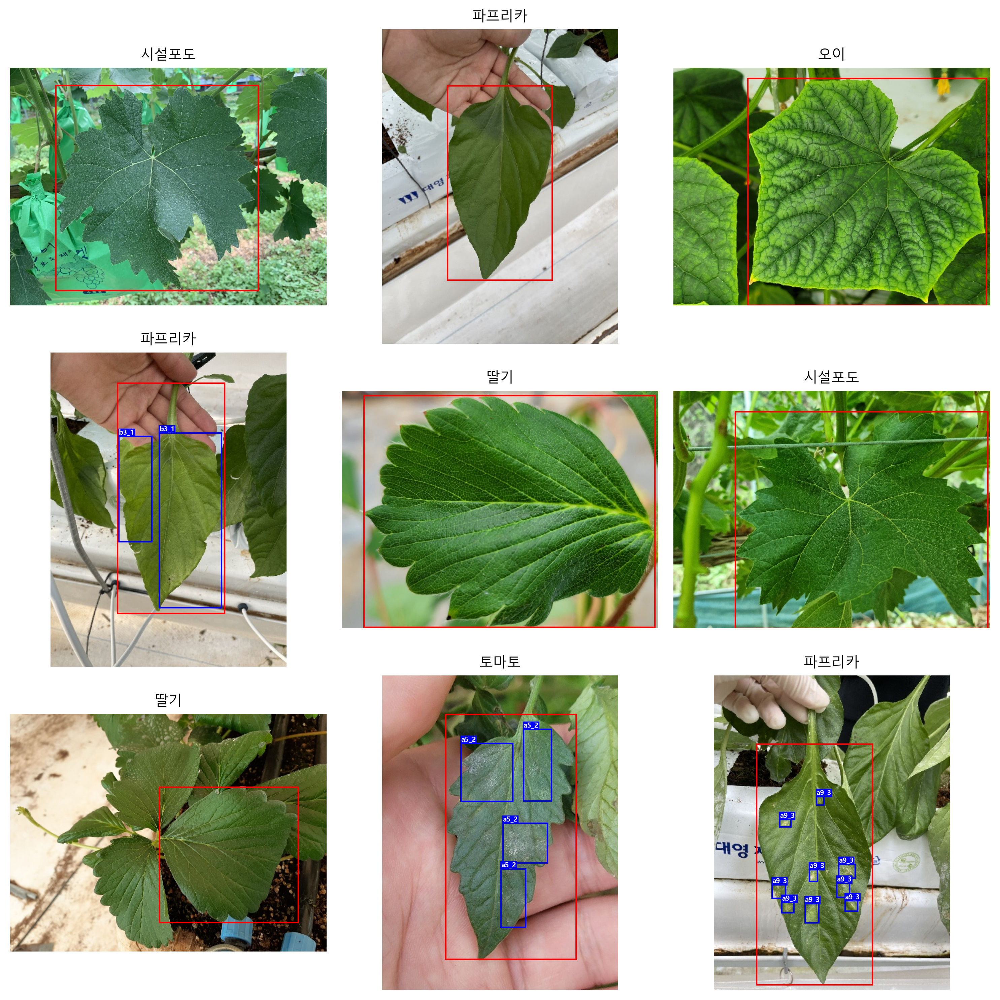

In [23]:
from matplotlib.patches import Rectangle

idx = 0
fig, axes = plt.subplots(3, 3, figsize=(10, 10), dpi=300)
view_list = np.random.randint(len(ids), size=9)

for image_num in view_list:
    image_file = ids[image_num]
    image_name = image_file[0:5]
    
    box = crops[image_num][0]
    part = parts[image_num]
    crop = box['crop']
    box = [
        box['bbox'][0]['x'], box['bbox'][0]['y'], box['bbox'][0]['w'], box['bbox'][0]['h'], 
    ]

    image = Image.open(f'data/train/{image_file[0:5]}/{image_file}').convert('RGB')
    axes.flat[idx].imshow(image)
    axes.flat[idx].set_title(categories[crops[image_num][0]['crop']], fontsize=10)
    axes.flat[idx].axis('off')
    
    rectangle = Rectangle((box[0], box[1]), box[2], box[3], fc='none', ec='r')
    axes.flat[idx].add_patch(rectangle)

    for p in part:
        box = p['bbox']

        rectangle = Rectangle((box[0], box[1]), box[2], box[3], fc='none', ec='b')
        axes.flat[idx].annotate(
            parts_label[image_num][0]['disease_risk'], (box[0], box[1]), color='w', weight='bold', 
            fontsize=5, ha='left', va='bottom', 
            bbox=dict(facecolor='b', edgecolor='b', pad=0.0))
        axes.flat[idx].add_patch(rectangle)
        
    idx += 1

fig.tight_layout()

# plt.savefig('fig1.png', dpi=300)
plt.show()

In [4]:
part_of_diseases = pd.DataFrame(a)
part_of_diseases.rename(columns = {0: 'counts_part'}, inplace=True)

In [5]:
print('Max of parts : ', part_of_diseases['counts_part'].max())
print('Sum of parts : ', part_of_diseases['counts_part'].sum())
print('Average of parts :', part_of_diseases['counts_part'].sum() / len(part_of_diseases))

Max of parts :  76
Sum of parts :  9883
Average of parts : 1.7137159701751343


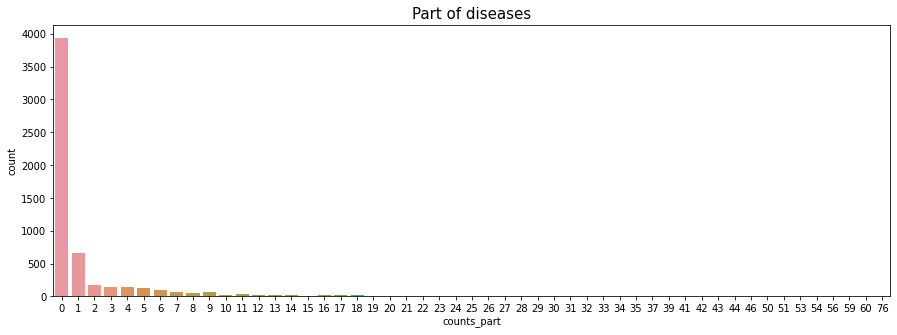

In [6]:
fig = plt.figure(figsize=(15,5))
plt.title('Part of diseases', fontsize=15)
sns.countplot(data = part_of_diseases, x = part_of_diseases['counts_part'])
plt.show()

In [7]:
# ## ADDED

# lens = []
# total_sum = 0
# total_cnt = 0

# temp_csv = pd.read_csv(csv_files[0])[csv_features]
# temp_csv = temp_csv.replace('-',np.nan).dropna() 
# temp_csv = temp_csv.astype(float)
# max_arr, min_arr = temp_csv.max().to_numpy(), temp_csv.min().to_numpy()
# total_sum += temp_csv.sum().to_numpy()
# total_cnt+=1

# # feature 별 최대값, 최솟값 계산
# for csv in tqdm(csv_files[1:]):
#     temp_csv = pd.read_csv(csv)[csv_features]
#     temp_csv = temp_csv.replace('-', np.nan).dropna()
#     lens.append(len(temp_csv))
#     if len(temp_csv) == 0:
#         continue    # nan값이면 최대, 최솟값 계산하지 않음
#     temp_csv = temp_csv.astype(float)
#     temp_max, temp_min = temp_csv.max().to_numpy(), temp_csv.min().to_numpy()
#     temp_sum = temp_csv.sum().to_numpy()
#     temp_cnt = len(temp_csv)

#     total_sum += temp_sum
#     total_cnt += temp_cnt

#     max_arr = np.max([max_arr,temp_max], axis=0)
#     min_arr = np.min([min_arr,temp_min], axis=0)

# # feature 별 최대값, 최솟값 dictionary 생성
# csv_feature_dict = {csv_features[i]:[min_arr[i], max_arr[i]] for i in range(len(csv_features))}

# # ADDED # feature 별 평균의 dict 생성 
# csv_means = total_sum/total_cnt
# csv_feature_mean_dict = {csv_features[i]:csv_means[i] for i in range(len(csv_features))}

# # save data
# with open('csv_feature_dict.pkl','wb') as fw:
#     pickle.dump(csv_feature_dict, fw)

# with open('csv_feature_mean_dict.pkl','wb') as fw:
#     pickle.dump(csv_feature_mean_dict, fw)

In [8]:
path = glob('data/train/*')
path.sort()

print(len(path)) ## len(train data) 

5767


In [9]:
def crop_distribute_path():
    data = []
    
    # Load All train data
    for file_path in path:
        k = file_path[-5:]
        sample_json = json.load(open(f'{file_path}/{k}.json', 'r'))
        data.append(file_path)
    return data

In [10]:
def json_df(file_path):
    k = file_path[-5:]

    sample_json = json.load(open(f'{file_path}/{k}.json', 'r'))
    
    part_length = len(sample_json['annotations']['part'])
    task = sample_json['description']['task']
    crop = sample_json['annotations']['crop']
    disease = sample_json['annotations']['disease']
    grow = sample_json['annotations']['grow']
    risk = sample_json['annotations']['risk']

    data = [[part_length, file_path, task, crop, disease, grow, risk]]
    json_dataframe = pd.DataFrame(data, columns=['part_length', 'file_path', 'task','crop','disease','grow','risk'])

    return json_dataframe

In [11]:
def temper_Humidity_df(file_path):
    csv_features = ['내부 온도 1 평균', '내부 습도 1 평균', '내부 이슬점 평균']
    k = file_path[-5:]
    csv_files = pd.read_csv(f'{file_path}/{k}.csv')

    temp_csv = csv_files[csv_features]
    max_arr, min_arr = temp_csv.max().to_numpy(), temp_csv.min().to_numpy()

    csv_feature_dict = [[min_arr[i], max_arr[i]] for i in range(len(csv_features))]

    data = []
    for i in range(3):
        data.append(min_arr[i])
        data.append(max_arr[i])


    temper_dataframe = pd.DataFrame([data], columns=['내부 온도 1 평균 min', '내부 온도 1 평균 max', '내부 습도 1 평균 min', '내부 습도 1 평균 max', '내부 이슬점 평균 min', '내부 이슬점 평균 max'])
    
    return temper_dataframe

In [12]:
def make_dataframe():
    path = crop_distribute_path()
    total_df = pd.DataFrame(None, columns=['part_length', 'file_path','task','crop','disease','grow','risk','내부 온도 1 평균 min', '내부 온도 1 평균 max', '내부 습도 1 평균 min', '내부 습도 1 평균 max', '내부 이슬점 평균 min', '내부 이슬점 평균 max'])
    for file_path in path:
        json_dataframe = json_df(file_path)
        temper_df = temper_Humidity_df(file_path)

        concat_df = pd.concat([json_dataframe, temper_df], axis=1)
        total_df = pd.concat([total_df, concat_df])
    
    total_df = total_df.set_index('file_path')
    return total_df

In [13]:
new_df = make_dataframe()
print(len(new_df))
new_df.head()

5767


,part_length,task,crop,disease,grow,risk,내부 온도 1 평균 min,내부 온도 1 평균 max,내부 습도 1 평균 min,내부 습도 1 평균 max,내부 이슬점 평균 min,내부 이슬점 평균 max
file_path,,,,,,,,,,,,
data/train\10027,2,2,3,b7,13,1,4.9,18.6,41.3,92.3,2.4,11
data/train\10037,0,0,3,00,11,0,16.9,30.7,52.3,94.7,14.1,22
data/train\10043,0,0,3,00,13,0,17.0,29.5,43.9,94.5,15.5,20.8
data/train\10045,0,0,3,00,11,0,15.2,29.4,50.8,93.4,13.8,20.9
data/train\10063,0,0,3,00,13,0,17.0,29.5,43.9,94.5,15.5,20.8


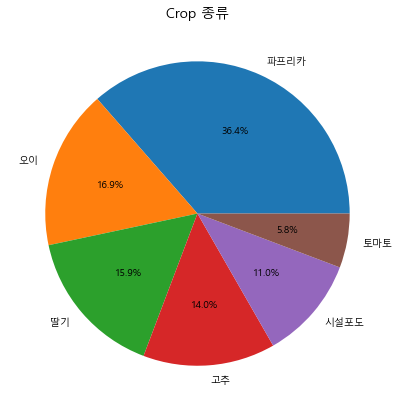

In [24]:
labels = {1:'딸기', 2:'토마토', 3:'파프리카', 4:'오이', 5:'고추', 6:'시설포도'}

plt.figure(figsize=(7,7))
plt.pie(new_df['crop'].value_counts(), labels=[labels[x] for x in new_df['crop'].unique()], autopct='%.1f%%')
plt.title("Crop 종류", fontsize=14)
# plt.savefig('variaty of crops', dpi=300)

plt.show()


In [25]:
df_straw = new_df[new_df['crop']==1]
df_tomato = new_df[new_df['crop']==2]
df_paprika = new_df[new_df['crop']==3]
df_cucumber = new_df[new_df['crop']==4]
df_pepper = new_df[new_df['crop']==5]
df_grape = new_df[new_df['crop']==6]

In [26]:
disease_dict = {'00' : '정상',
                'a1' : '딸기잿빛곰팡이병',
                'a2' : '딸기흰가루병',
                'a3' : '오이노균병',
                'a4' : '오이흰가루병',
                'a5' : '토마토흰가루병',
                'a6' : '토마토잿빛곰팡이병',
                'a7' : '고추탄저병',
                'a8' : '고추흰가루병',
                'a9' : '파프리카흰가루병',
                'a10' : '파프리카잘록병',
                'a11' : '시설포도탄저병',
                'a12' : '시설포도노균병',
                'b1' : '냉해피해',
                'b2' : '열과',
                'b3' : '칼슘결핍',
                'b4' : '일소피해',
                'b5' : '축과병',
                'b6' : '다량원소결핍 (N)',
                'b7' : '다량원소결핍 (P)',
                'b8' : '다량원소결핍 (K)',
                'c1' : '딸기잿빛곰팡이병반응',
                'c2' : '딸기흰가루병반응',
                'c3' : '오이노균병반응',
                'c4' : '오이흰가루병반응',
                'c5' : '토마토흰가루병반응',
                'c6' : '토마토잿빛곰팡이병반응',
                'c7' : '고추탄저병반응',
                'c8' : '고추흰가루병반응',
                'c9' : '파프리카흰가루병반응',
                'c10' : '파프리카잘록병반응',
                'c11' : '시설포도탄저병반응',
                'c12' : '시설포도노균병반응'
               }


def crop_disease(df, ax):
    name = df['crop'].replace(labels).unique()
    ax.pie(df['disease'].value_counts(), labels=[disease_dict[x] for x in df['disease'].unique()], autopct='%.1f%%')
    ax.set_title(f'{name} disease', fontsize=14)

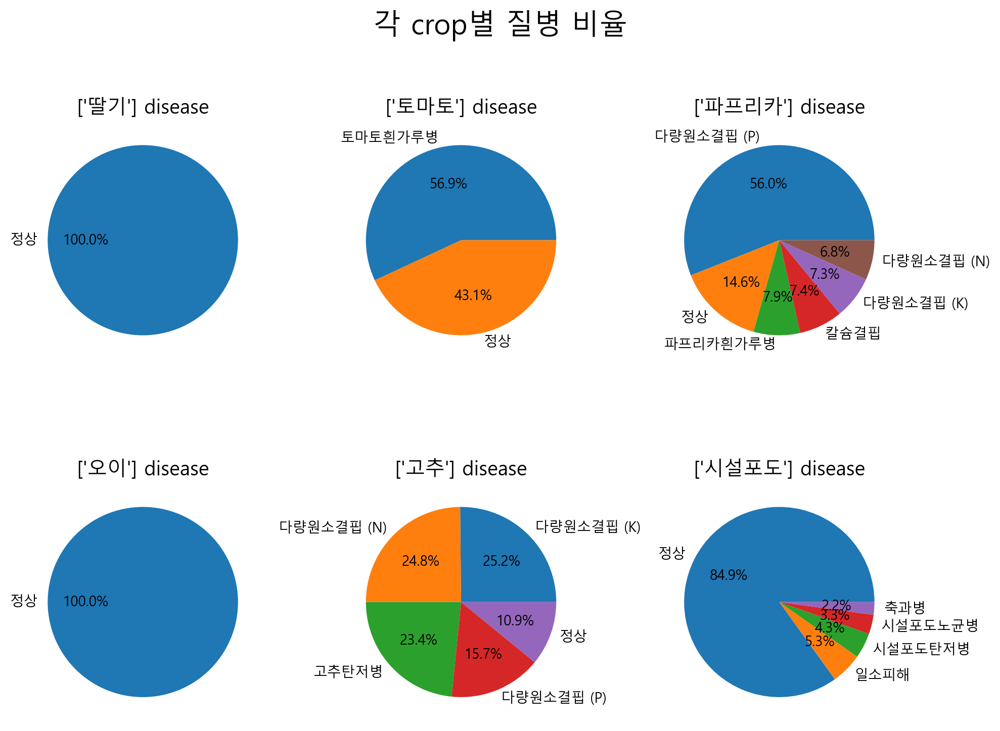

In [27]:
fig, axes = plt.subplots(2, 3, figsize=(10,8), dpi=200)

crop_disease(df_straw, axes.flat[0])
crop_disease(df_tomato, axes.flat[1])
crop_disease(df_paprika, axes.flat[2])
crop_disease(df_cucumber, axes.flat[3])
crop_disease(df_pepper, axes.flat[4])
crop_disease(df_grape, axes.flat[5])

plt.suptitle('각 crop별 질병 비율', fontsize=20)
fig.tight_layout()
# plt.savefig('crop_disease', dpi=300)
plt.show()


In [ ]:
fig, axes = plt.subplots(2, 3, figsize=(10,8), dpi=200)
risk = {0:'정상', 1:'초기', 2:'중기', 3:'말기'}

def crop_disease_risk(df, ax):
    name = df['crop'].replace(labels).unique()
    ax.pie(df['risk'].value_counts(), labels=[risk[x] for x in df['risk'].unique()], autopct='%.1f%%')
    ax.set_title(f'{name} disease risk', fontsize=14)
    
crop_disease_risk(df_straw, axes.flat[0])
crop_disease_risk(df_tomato, axes.flat[1])
crop_disease_risk(df_paprika, axes.flat[2])
crop_disease_risk(df_cucumber, axes.flat[3])
crop_disease_risk(df_pepper, axes.flat[4])
crop_disease_risk(df_grape, axes.flat[5])

plt.suptitle('각 crop별 질병 진행현황 비율', fontsize=20)
# plt.savefig('crop_disease_risk', dpi=300)
plt.show()